In [1]:
pip install pandas==1.5.3


Note: you may need to restart the kernel to use updated packages.


In [65]:

import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [66]:
dados_gerais = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/Dados_totais.csv')
dados_generos = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_genres.csv')
dados_anos = pd.read_csv('https://raw.githubusercontent.com/sthemonica/music-clustering/main/Dados/data_by_year.csv')

In [67]:
dados_gerais.head(10)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,3,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,7,0.2440,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,6,0.5180,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,8,0.0821,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,1,0.3550,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again


In [68]:
dados_generos.head(10)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7
5,1,abstract,0.459210,0.516167,3.431965e+05,0.442417,0.849667,0.118067,-15.472083,0.046517,127.885750,0.307325,43.500000,1
6,1,abstract beats,0.342147,0.623000,2.299362e+05,0.527800,0.333603,0.099653,-7.918000,0.116373,112.413800,0.493507,58.933333,10
7,1,abstract hip hop,0.243854,0.694571,2.318492e+05,0.646235,0.024231,0.168543,-7.349328,0.214258,108.244987,0.571391,39.790702,2
8,0,accordeon,0.323000,0.588000,1.640000e+05,0.392000,0.441000,0.079400,-14.899000,0.072700,109.131000,0.709000,39.000000,2
9,1,accordion,0.446125,0.624812,1.670616e+05,0.373437,0.193738,0.160300,-14.487063,0.078537,112.872438,0.658688,21.937500,2


In [69]:
print("dos dados gerais \n", dados_gerais['year'].unique() ) 
print( "dos dados anos\n", dados_anos['year'].unique())

dos dados gerais 
 [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020]
dos dados anos
 [1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933 1934
 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948
 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962
 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976
 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990
 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020]


In [70]:
dados_gerais = dados_gerais.drop(["explicit", "key", "mode"], axis= 1)
dados_gerais.shape

(20311, 16)

In [71]:
dados_gerais.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [72]:
dados_generos = dados_generos.drop(["key", "mode"], axis= 1)
dados_generos.shape

(2973, 12)

In [73]:
dados_generos.isna().sum()

genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

In [74]:
dados_anos = dados_anos[dados_anos['year'] >= 2000]
print("\n ", dados_anos['year'].unique())


  [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020]


In [75]:
dados_anos= dados_anos.drop(["key", "mode"], axis= 1)
dados_anos.shape

(21, 12)

In [76]:
dados_anos.reset_index()

,index,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
3,82,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
4,83,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143
5,84,2005,0.255764,0.572281,237229.588205,0.653209,0.090194,0.190082,-7.466159,0.093334,121.617967,0.532531,50.953333
6,85,2006,0.279986,0.568230,234042.914359,0.650326,0.077701,0.188289,-7.265501,0.085847,121.798615,0.520028,51.313846
7,86,2007,0.254081,0.563414,241049.962564,0.668305,0.072957,0.196127,-7.044536,0.084347,124.087516,0.516794,51.075897
8,87,2008,0.249192,0.579193,240107.315601,0.671461,0.063662,0.198431,-6.843804,0.077356,123.509934,0.527542,50.630179
9,88,2009,0.261929,0.564190,238140.013265,0.670749,0.075872,0.205252,-7.046015,0.085458,123.463808,0.507170,51.440816


In [77]:
dados_anos['popularity'].describe()

count    21.000000
mean     54.197722
std       5.716386
min      46.684049
25%      50.630179
50%      52.655013
75%      56.700608
max      65.256542
Name: popularity, dtype: float64

In [78]:
fig = px.line(dados_anos, x = "year", y = "loudness", markers=True, title=' Variação de loudness ')
fig.show()

In [79]:
import plotly.graph_objects as go
fig = go.Figure()


#adicionando os dados (são extensos mas podemos replicar)

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['acousticness'],
                         name= 'Acousticness'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['valence'],
                         name= 'Valence'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['danceability'],
                         name= 'Danceability'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['energy'],
                         name= 'Energy'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['instrumentalness'],
                         name= 'Instrumentalness'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['liveness'],
                         name= 'Liveness'))

fig.add_trace(go.Scatter(x = dados_anos['year'], y = dados_anos['speechiness'],
                         name= 'Spechinees'))

fig.show()

In [17]:
fig = px.imshow(dados_anos.corr(), text_auto= True)
fig.show()

# PCA e StandardScaler

In [80]:
print( "Quantidade de dados presentes na coluna de Genero: ", dados_generos['genres'].value_counts().sum())

Quantidade de dados presentes na coluna de Genero:  2973


In [81]:
dados_generos1 = dados_generos.drop('genres', axis=1)
dados_generos1

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071
...,...,...,...,...,...,...,...,...,...,...,...
2968,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943
2969,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000
2970,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667
2971,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000


In [82]:
from sklearn.decomposition import PCA 
from sklearn.pipeline import Pipeline 
from sklearn.preprocessing import StandardScaler 

SEED = 1224

np.random.seed(1224)
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components= 2, random_state= SEED))])

In [21]:
genre_training_pca = pca_pipeline.fit_transform(dados_generos1)
projection = pd.DataFrame(columns= ['x','y'], data = genre_training_pca)
projection

,x,y
0,5.910268,-0.011146
1,2.787093,4.498483
2,-0.757538,-1.258495
3,1.020521,-0.931690
4,0.753911,-0.999861
...,...,...
2968,-0.475136,-0.017126
2969,-3.026756,-1.304983
2970,-0.832511,-1.089726
2971,1.774790,-3.695233


In [83]:
from sklearn.cluster import KMeans

In [84]:
kmeans_pca = KMeans(n_clusters= 5, verbose= True, random_state=SEED)
kmeans_pca.fit(projection)
dados_generos['cluster_pca'] = kmeans_pca.predict(projection)
projection['cluster_pca'] = kmeans_pca.predict(projection)

Initialization complete
Iteration 0, inertia 5323.8335963784575
Iteration 1, inertia 3517.289052315707
Iteration 2, inertia 3504.413721512142
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 6250.701124587309
Iteration 1, inertia 4498.24695961781
Iteration 2, inertia 4445.650657612117
Iteration 3, inertia 4430.2954757117905
Iteration 4, inertia 4422.107161167875
Iteration 5, inertia 4417.573056247907
Iteration 6, inertia 4413.42393252334
Iteration 7, inertia 4411.287999316907
Iteration 8, inertia 4408.3669695351
Iteration 9, inertia 4405.4531682377
Iteration 10, inertia 4400.754759457246
Iteration 11, inertia 4389.604810320134
Iteration 12, inertia 4370.838883749327
Iteration 13, inertia 4329.020375719168
Iteration 14, inertia 4245.243498049436
Iteration 15, inertia 4064.7305083405436
Iteration 16, inertia 3753.476526139753
Iteration 17, inertia 3578.1668410986695
Iteration 18, inertia 3508.325589498713
Iteration 19, inertia 3504.4137215121414


In [85]:
projection

,x,y,cluster_pca
0,5.910268,-0.011146,2
1,2.787093,4.498483,2
2,-0.757538,-1.258495,3
3,1.020521,-0.931690,4
4,0.753911,-0.999861,4
...,...,...,...
2968,-0.475136,-0.017126,1
2969,-3.026756,-1.304983,3
2970,-0.832511,-1.089726,3
2971,1.774790,-3.695233,4


In [86]:
fig = px.scatter(
    projection, x='x', y='y', color= 'cluster_pca', hover_data=['x','y', 'cluster_pca']
    )
fig.show()


In [90]:
pca_pipeline[1].explained_variance_.sum().round(2)

AttributeError: 'PCA' object has no attribute 'explained_variance_'

In [91]:
pca_pipeline[1].explained_variance_ratio_.sum().round(2)*100

AttributeError: 'PCA' object has no attribute 'explained_variance_ratio_'

In [92]:
pca_pipeline

Pipeline(steps=[('scaler', StandardScaler()),
                ('PCA', PCA(n_components=2, random_state=1224))])

In [93]:
dados_gerais.artists.value_counts()

Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: artists, Length: 875, dtype: int64

In [94]:
dados_gerais.artists_song.value_counts()

Coldplay - Yellow                                                   1
Juice WRLD - Intro                                                  1
Carrie Underwood - The Champion - Bonus Track                       1
YoungBoy Never Broke Again - Cross Me (feat. Lil Baby and Plies)    1
Twenty One Pilots - Morph                                           1
                                                                   ..
Taylor Swift - Come Back...Be Here                                  1
Banda El Recodo - Me Gusta Todo De Ti                               1
Michael Bublé - The Christmas Song                                  1
Glee Cast - Smooth Criminal (Glee Cast Version) (feat. 2CELLOS)     1
Eminem - Darkness                                                   1
Name: artists_song, Length: 20311, dtype: int64

In [95]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(dtype= int)

In [96]:
colunas_ohe = ohe.fit_transform(dados_gerais[['artists']]).toarray()
dados2 = dados_gerais.drop('artists', axis=1)
dados_musicas_dummies = pd.concat([dados2, pd.DataFrame(colunas_ohe, columns=ohe.get_feature_names_out(['artists']))], axis=1)
dados_musicas_dummies

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


In [97]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components= 0.7, random_state= SEED))])
music_embedding_pca = pca_pipeline.fit_transform(dados_musicas_dummies.drop(
    ['id', 'artists_song','name'], axis=1))
projection_m = pd.DataFrame(data=music_embedding_pca)

#### n_components é usado para especificar o número desejado de componentes principais antes de ajustar o modelo, enquanto n_components_ é usado para acessar o número real de componentes principais calculados após o ajuste.

In [98]:
pca_pipeline[1].n_components_

612

In [99]:
kmeans_pca_pipeline = KMeans(n_clusters= 50, verbose= False, random_state=SEED)
kmeans_pca_pipeline.fit(projection_m)
dados_gerais['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)
projection_m['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m)


In [100]:
projection_m['artists'] = dados_gerais['artists']
projection_m['song'] = dados_gerais['artists_song']


In [101]:
projection_m.columns

Index([            0,             1,             2,             3,
                   4,             5,             6,             7,
                   8,             9,
       ...
                 605,           606,           607,           608,
                 609,           610,           611, 'cluster_pca',
           'artists',        'song'],
      dtype='object', length=615)

In [102]:
fig = px.scatter(
    projection_m, x=0, y=1, color= 'cluster_pca' ,hover_data=[0,1, 'song']
    )
fig.show()

In [103]:
pca_pipeline[1].explained_variance_ratio_.sum()

0.7000008463187031

In [104]:
pca_pipeline[1].explained_variance_.sum()

620.9313218688692

In [128]:
from pandas.core.dtypes.cast import maybe_upcast
from sklearn.metrics.pairwise import euclidean_distances

def music_post(nome_musica):
    nome_musica = 'Ed Sheeran - Shape of You'

cluster = list(projection_m[projection_m['song']== nome_musica]['cluster_pca'])[0]
musicas_recomendadas = projection_m[projection_m['cluster_pca']== cluster][[0, 1, 'song']]
x_musica = list(projection_m[projection_m['song']== nome_musica][0])[0]
y_musica = list(projection_m[projection_m['song']== nome_musica][1])[0]

#distâncias euclidianas
distancias = euclidean_distances(musicas_recomendadas[[0, 1]], [[x_musica, y_musica]])
musicas_recomendadas['id'] = dados_gerais['id']
musicas_recomendadas['distancias']= distancias
recomendada = musicas_recomendadas.sort_values('distancias').head(10)
  





## Começando com o spotipy

In [106]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth

In [107]:
scope = "user-library-read playlist-modify-private"
OAuth = SpotifyOAuth(scope= scope,
                     client_id=  '195ecc33d37b409cacdb0db8da73d596',
                     client_secret= '177ed513265949b6af33b5299a3f529e',
                     redirect_uri=  'http://localhost:8888/callback'
                     )

In [108]:
client_credentials_manager = SpotifyClientCredentials(client_id= '195ecc33d37b409cacdb0db8da73d596', client_secret= '177ed513265949b6af33b5299a3f529e')
sp = spotipy.Spotify(client_credentials_manager= client_credentials_manager)

In [122]:
import matplotlib.pyplot as plt
from skimage import io
import requests


### SEMPRE QUE QUISER ACHAR UM ID NUMA COLUNA, FAÇA ISTO, OU QUALQUER OUTRO DADO ESPECÍFICO EM UMA LINHA

In [110]:
nome_musica = 'Ed Sheeran - Shape of You'
id = dados_gerais[dados_gerais['artists_song']== nome_musica]['id'].iloc[0]
id

'7qiZfU4dY1lWllzX7mPBI3'

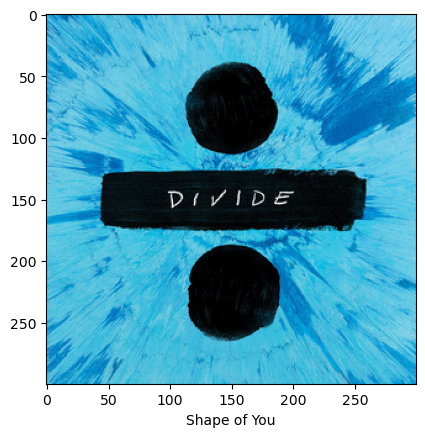

In [112]:
#mexendo no json
track = sp.track(id)
url = track['album']['images'][1]["url"]
name = track['name']
image = io.imread(image_url)
#mexendo com a imagem
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()

In [149]:
def recomendas(playlist_id):
    url = []
    name = []
    artists = []
   
    for i in playlist_id:
        track = sp.track(i)
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])
        artists.append(track['artists'][0]['name'])

    return name, url, artists


In [151]:
name, url= recomendas(recomendada['id'])

ValueError: too many values to unpack (expected 2)

In [153]:
print(name,"\n\n\n", url)

['Shape of You', 'Hear Me Calling', 'Be Kind (with Halsey)', 'Will - Remix', 'WRONG (feat. Lil Mosey)', 'Paranoia (feat. Gunna & Young Thug)', 'South of the Border (feat. Camila Cabello & Cardi B)', '1.5', 'What It Is (feat. Chris Brown)', 'G Walk (with Chris Brown)'] 


 ['https://i.scdn.co/image/ab67616d00001e02ba5db46f4b838ef6027e6f96', 'https://i.scdn.co/image/ab67616d00001e02af149eb4002f65f83afc63c4', 'https://i.scdn.co/image/ab67616d00001e02fdf2e993e10e67396b3bf759', 'https://i.scdn.co/image/ab67616d00001e024ac196312c24faedb76a345e', 'https://i.scdn.co/image/ab67616d00001e02891f0552bed344dc2bfe322f', 'https://i.scdn.co/image/ab67616d00001e0246e1307c35579c3483ea7b03', 'https://i.scdn.co/image/ab67616d00001e0273304ce0653c7758dd94b259', 'https://i.scdn.co/image/ab67616d00001e02280689ecc5e4b2038bb5e4bd', 'https://i.scdn.co/image/ab67616d00001e02b46b5fb6fdc6f5c720fcb183', 'https://i.scdn.co/image/ab67616d00001e0232ba22ba4df6a89bb6bfe3cf']


In [154]:
dados_recomendacoes = pd.DataFrame()
dados_recomendacoes['nome_musica'] = name

dados_recomendacoes['url'] = url

In [155]:
dados_recomendacoes.url

0    https://i.scdn.co/image/ab67616d00001e02ba5db4...
1    https://i.scdn.co/image/ab67616d00001e02af149e...
2    https://i.scdn.co/image/ab67616d00001e02fdf2e9...
3    https://i.scdn.co/image/ab67616d00001e024ac196...
4    https://i.scdn.co/image/ab67616d00001e02891f05...
5    https://i.scdn.co/image/ab67616d00001e0246e130...
6    https://i.scdn.co/image/ab67616d00001e0273304c...
7    https://i.scdn.co/image/ab67616d00001e02280689...
8    https://i.scdn.co/image/ab67616d00001e02b46b5f...
9    https://i.scdn.co/image/ab67616d00001e0232ba22...
Name: url, dtype: object

In [ ]:
def web_image(name, url, columns=5, image_size=(4, 4)):
    num_images = len(url)
    rows = (num_images + columns - 1) // columns

    plt.figure(figsize=(columns * image_size[0], rows * image_size[1]))

    for i, u in enumerate(url):
        ax = plt.subplot(rows, columns, i + 1)
        image = io.imread(u)
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax.set_title(name[i], fontsize=20)
    
    plt.tight_layout()
    plt.show()

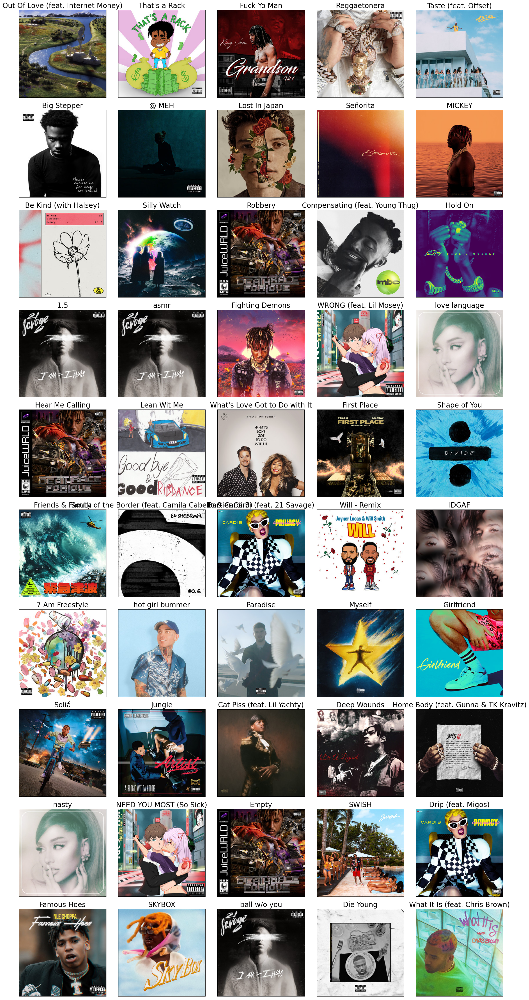

In [ ]:
web_image(name,url)

In [158]:
def recomendador_de_musicas(nome_musica):



  cluster = list(projection_m[projection_m['song']== nome_musica]['cluster_pca'])[0]
  musicas_recomendadas = projection_m[projection_m['cluster_pca']== cluster][[0, 1, 'song']]
  x_musica = list(projection_m[projection_m['song']== nome_musica][0])[0]
  y_musica = list(projection_m[projection_m['song']== nome_musica][1])[0]
  distancias = euclidean_distances(musicas_recomendadas[[0, 1]], [[x_musica, y_musica]])
  musicas_recomendadas['id'] = dados_gerais['id']
  musicas_recomendadas['distancias'] = distancias
  recomendada = musicas_recomendadas.sort_values('distancias').head(10)

  # ## Acessando os dados de cada música com a biblioteca Spotipy (nome e imagem)
  playlist_id = recomendada['id']

  url = []
  name = []
  for i in playlist_id:
      track = sp.track(i)
      url.append(track["album"]["images"][1]["url"])
      name.append(track["name"])

# ## Plotando as figuras
  plt.figure(figsize=(15,10))
  columns = 5
  for i, u in enumerate(url):
      ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
      image = io.imread(u)
      plt.imshow(image)
      ax.get_yaxis().set_visible(False)
      plt.xticks(color = 'w', fontsize = 0.1)
      plt.yticks(color = 'w', fontsize = 0.1)
      plt.xlabel(name[i], fontsize = 10)
      plt.tight_layout(h_pad=0.7, w_pad=0)
      plt.subplots_adjust(wspace=None, hspace=None)
      plt.grid(visible=None)
      plt.tick_params(bottom = False)
  plt.show()


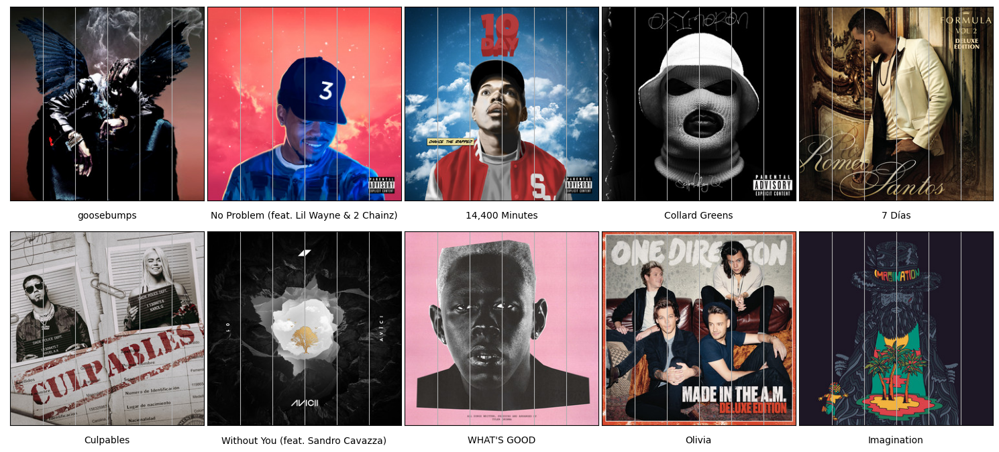

In [163]:
recomendador_de_musicas("Travis Scott - goosebumps")